# End-to-End Multi-Class Dog Breed Classification
This notebook builds an end-to-end multi-class image classifier using TensorFlow and TensorFlow Hub.

## Problem
Identifying the breed of the dog given an image of a dog.

## Data
The data is we will use is the Kaggle's dog breed identification data from the following link:

https://www.kaggle.com/c/dog-breed-identification/overview

## Evaluation
The evaluation is a file with prediction probability for each dog breed of each test image.

https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## Features
Some Information about the data:
* We're dealing with images(unstructured data) so it's probably best to use deep learning/transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes) this means this is multiclass classification problem.
* There are around 10,000+ images in the training set (these images have labels).
* There are around 10,000+ images in the test set (these images have no labels, because we'll want to predict them).


In [ ]:
# Unzipping the dataset
# !unzip "drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog Vision/"

In [ ]:
import tensorflow as tf
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import os
import tensorflow_hub as hub

In [ ]:
print(tf.__version__)
print(hub.__version__)

2.11.0
0.13.0


TensorFlow helps us in running numerical computing faster by using a GPU so we will use GPU.

In [ ]:
# Checking if a GPU is available or not
print('GPU is working' if tf.config.list_physical_devices('GPU') else "Stop")

GPU is working


#### First of all we will load the labels and convert images into the tensors


In [ ]:
# Loading the labels file
labels_csv = pd.read_csv('drive/MyDrive/Dog Vision/labels.csv')
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
labels_csv.describe

<bound method NDFrame.describe of                                      id                     breed
0      000bec180eb18c7604dcecc8fe0dba07               boston_bull
1      001513dfcb2ffafc82cccf4d8bbaba97                     dingo
2      001cdf01b096e06d78e9e5112d419397                  pekinese
3      00214f311d5d2247d5dfe4fe24b2303d                  bluetick
4      0021f9ceb3235effd7fcde7f7538ed62          golden_retriever
...                                 ...                       ...
10217  ffd25009d635cfd16e793503ac5edef0                    borzoi
10218  ffd3f636f7f379c51ba3648a9ff8254f            dandie_dinmont
10219  ffe2ca6c940cddfee68fa3cc6c63213f                  airedale
10220  ffe5f6d8e2bff356e9482a80a6e29aac        miniature_pinscher
10221  fff43b07992508bc822f33d8ffd902ae  chesapeake_bay_retriever

[10222 rows x 2 columns]>

In [ ]:
labels_csv.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10222 entries, 0 to 10221
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      10222 non-null  object
 1   breed   10222 non-null  object
dtypes: object(2)
memory usage: 159.8+ KB


In [ ]:
labels_csv.shape

(10222, 2)

In [ ]:
labels_csv.value_counts()

id                                breed                     
000bec180eb18c7604dcecc8fe0dba07  boston_bull                   1
ab3aec7ac57f86ba1298d43d6fd3613d  malamute                      1
ab15179d96c2fbc0c16c46683f92f001  cardigan                      1
ab16b0a2feea44546a293be0cf233261  ibizan_hound                  1
ab1715c4f68734a7fecb8901e9baf72a  irish_terrier                 1
                                                               ..
54c60fe48c432816a32b860a32bd9be3  miniature_poodle              1
54d4876e394145a19762cbe38b44b3d4  silky_terrier                 1
54e13fffdce2fc4807122c9b8861bf94  redbone                       1
54e86ccdccd89c2b15d712c61b9460a9  greater_swiss_mountain_dog    1
fff43b07992508bc822f33d8ffd902ae  chesapeake_bay_retriever      1
Length: 10222, dtype: int64

<Axes: >

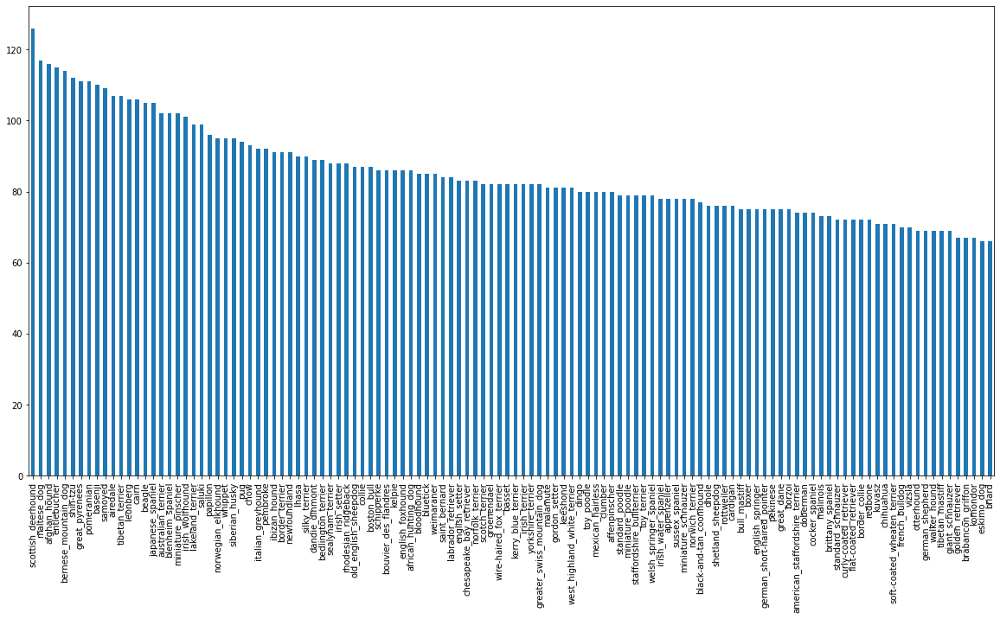

In [ ]:
# Let's see value_counts visually
labels_csv.breed.value_counts().plot.bar(figsize=(20,10))

In [ ]:
# The data is almost good as it has good number of images (ideal number of minimum images is 10)
# What's the median number of images for each class?
labels_csv['breed'].value_counts().median()

82.0

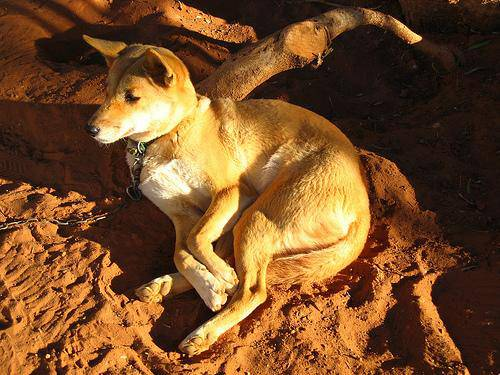

In [ ]:
# Checking an image
from IPython.display import Image
Image('drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg')

In [ ]:
print(os.listdir('drive/MyDrive/Dog Vision/train/')[:10])

['e42d24760fcb9e6273a29e2f083ba9b6.jpg', 'dc068bd9527c4b3d7cf62fa73ae23bbe.jpg', 'dd126e42b474c3831f8fda33052428c1.jpg', 'df46a6469c374b869375ef18a34bfe35.jpg', 'e4a2121c2de5de095855677d4e6eca71.jpg', 'dc3d4d214533950f6465ec2483af39c0.jpg', 'e86acb593c6718489134a45e8b936b90.jpg', 'e818d5a7782350e72171c3dfa05af02a.jpg', 'e001b6f5092b2b90501111b23ab30d12.jpg', 'dc28c131838c21c74b77e2c4f411fd4b.jpg']


In [ ]:
labels_csv['id'][:10]

0    000bec180eb18c7604dcecc8fe0dba07
1    001513dfcb2ffafc82cccf4d8bbaba97
2    001cdf01b096e06d78e9e5112d419397
3    00214f311d5d2247d5dfe4fe24b2303d
4    0021f9ceb3235effd7fcde7f7538ed62
5    002211c81b498ef88e1b40b9abf84e1d
6    00290d3e1fdd27226ba27a8ce248ce85
7    002a283a315af96eaea0e28e7163b21b
8    003df8b8a8b05244b1d920bb6cf451f9
9    0042188c895a2f14ef64a918ed9c7b64
Name: id, dtype: object

In [ ]:
# Creating path names from Image id's
filenames = ['drive/MyDrive/Dog Vision/train/' + filename + '.jpg' for filename in labels_csv['id']]
# Checking some values
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Checking if the number of values match the actual values so that we can proceed
if len(os.listdir('drive/My Drive/Dog Vision/train/')) == len(filenames):
  print('Values are same, You can Proceed!')
else:
  print('Stop!!! Values are not same')

Values are same, You can Proceed!


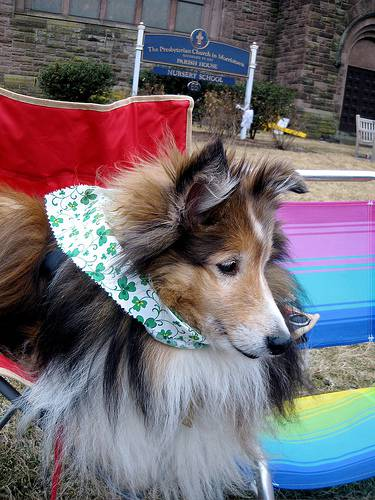

In [ ]:
# Checking one more image
Image(filenames[10])

In [ ]:
# Checking the breed of the image
labels_csv['breed'][10]

'shetland_sheepdog'

## Turning data labels (breed) into numbers

In [ ]:
labels = labels_csv['breed'].to_numpy()
labels
type(labels)

numpy.ndarray

In [ ]:
# See if the number of labels matches the number of filenames
if len(labels)==len(filenames):
  print('Proceed')
else:
  print('Stop')

Proceed


In [ ]:
# Finding the unique label values
unique_breeds = np.unique(labels_csv['breed'])
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
len(unique_breeds)

120

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into an array of boolean
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
# Viewing an example of what we've done
print(labels[0])
print(np.where(unique_breeds == labels[0]))
print(boolean_labels[0].argmax())
print(boolean_labels[0].astype(int))

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


## Since the Kaggle dataset don't have a validation set, so we will create our own.

In [ ]:
# Setup X and y
X = filenames
y = boolean_labels

In [ ]:
# Reducing the images to ~1000 for experimentation
NUM_IMAGES = 1000 # @param {type:'slider',min:1000,max:10000, step:1000}

In [ ]:
# Splitting our data into Train and Validation
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                 y[:NUM_IMAGES],
                                                 test_size=0.2,
                                                 random_state = 42)
len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

# Converting the images into tensors:
https://www.tensorflow.org/tutorials/load_data/images
## To preprocess our images into tensors we're going to write a function which does a few things:
1. Take an image filepath as input
2. Use Tensorflow to read the file and save it to a variable `image`
3. Turn our `image` (a jpg image) into Tensors
4. Normalization: Covert the color channel values from 0-255 to 0-1.
5. Resize an image to a shape of (224,224)
6. Return the modified image

Before do above, lets see what importing an image looks like.

In [ ]:
# Converting image into numpy array
from matplotlib.pyplot import imread
image = imread(filenames[23])
image.shape

(210, 291, 3)

In [ ]:
image.max(), image.min()  # max and min range of RGB

(255, 0)

In [ ]:
# Converting the image into tensor
tf.constant(image)

<tf.Tensor: shape=(210, 291, 3), dtype=uint8, numpy=
array([[[214, 235, 236],
        [241, 255, 255],
        [163, 181, 185],
        ...,
        [253, 255, 245],
        [253, 255, 245],
        [253, 255, 245]],

       [[233, 249, 248],
        [228, 244, 243],
        [ 97, 111, 112],
        ...,
        [252, 254, 249],
        [252, 254, 249],
        [252, 254, 249]],

       [[249, 255, 253],
        [239, 248, 245],
        [102, 108, 108],
        ...,
        [255, 254, 255],
        [255, 254, 255],
        [255, 254, 255]],

       ...,

       [[236, 237, 205],
        [225, 220, 190],
        [232, 216, 190],
        ...,
        [163, 112, 108],
        [154, 103,  99],
        [221, 170, 166]],

       [[243, 255, 255],
        [235, 245, 246],
        [248, 255, 255],
        ...,
        [141, 128, 109],
        [131, 118,  99],
        [199, 186, 167]],

       [[243, 255, 255],
        [235, 245, 246],
        [248, 255, 255],
        ...,
        [141, 128, 10

#### Function which will do the following:
1. Take an image filepath as input
2. Use Tensorflow to read the file and save it to a variable `image`
3. Turn our `image` (a jpg image) into Tensors
4. Normalization: Covert the color channel values from 0-255 to 0-1.
5. Resize image to a shape of (224,224)
6. Return the modified image


In [ ]:
IMG_SIZE = 224
def process_image(img_path):
  # read the file using tf
  image = tf.io.read_file(img_path)
  #Turning images into tensors
  image = tf.image.decode_jpeg(image, channels = 3)
  # converting the value of color channel between 0 and 1
  image = tf.image.convert_image_dtype(image,tf.float32)
  # Resizing the image
  image = tf.image.resize(image, size = [IMG_SIZE, IMG_SIZE])

  return image


## Turning data into batches

Why turn our data into batches?

Let's say you are going to to process 10,000+ images in one go....they all might not fit into memory(i.e. GPU which has a limited space).

So that's why we do about 32 (this is the batch size) images at a time (You can also adjust the batch number if needed).

In order to use TensorFlow effectively, we need our data in form of Tensor tuples which looks like this:
`(image, label)`(these two should be in form of tensors)

In [ ]:
# Creating a simple function to return the tuple (image, label)
def get_img_label(image_path, label):
  image = process_image(image_path)
  return image, label

In [ ]:
# Demo of above
(process_image(X[0]), tf.constant(y[0]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.5705322 , 0.33588538, 0.15008473],
         [0.66901225, 0.4601166 , 0.26022965],
         [0.61062384, 0.43763596, 0.21601713],
         ...,
         [0.8182312 , 0.7297958 , 0.26963907],
         [0.72454786, 0.6059109 , 0.2653059 ],
         [0.7494603 , 0.6252918 , 0.32456532]],
 
        [[0.6761415 , 0.4733761 , 0.30642927],
         [0.5672121 , 0.38192675, 0.20349538],
         [0.5883547 , 0.4322571 , 0.2403155 ],
         ...,
         [0.9326942 , 0.8260503 , 0.41093278],
         [0.86072475, 0.74250627, 0.3694122 ],
         [0.76781666, 0.6461604 , 0.29291284]],
 
        [[0.46350825, 0.29595745, 0.1536156 ],
         [0.42554107, 0.27039403, 0.12009468],
         [0.7887875 , 0.6547362 , 0.49015   ],
         ...,
         [0.89372385, 0.7696401 , 0.41811958],
         [0.88609535, 0.7585918 , 0.36495727],
         [0.8243601 , 0.69494826, 0.2930575 ]],
 
        ...,
 
        [[0.7344025 , 0.4716574 

### Now we've got a way to turn our image into tuples of tensors in the form (image, label), let's make a function to turn our data into batches.

In [ ]:
# Define the batch size, 32 is a good to start
BATCH_SIZE = 32

# Create a function to turn our data into batches
def create_data_batches(X, y = None, batch_size = BATCH_SIZE, test_data = False, valid_data = False):
  """
  Creates batches of data out of image X and label y pairs.
  Shuffles the data if it's training data but doesn't shuffle the data if it is validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is test dataset, we probably don't have labels
  if test_data:
    print('Creating test data batch...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is valid dataset, we don't need to shuffle it
  if valid_data:
    print('Creating valid data batch...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                              tf.constant(y)))
    data_batch = data.map(get_img_label).batch(BATCH_SIZE)
    return data_batch

  # if the data is train dataset, we have to shuffle it
  else:
    print('Creating Train data batch...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                              tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor funtion is faster than shuffling images
    data = data.shuffle(buffer_size = len(X))
    data_batch = data.map(get_img_label).batch(BATCH_SIZE)
  return data_batch

In [ ]:
# Create training and valid data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data = True)

Creating Train data batch...
Creating valid data batch...


In [ ]:
# Check out the different attributes of data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

# Visualizing Data Batches
Our data is now in batches, however these can be a little hard to understand/comprehend, let's visualize the data:

In [ ]:
# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch
  """
  # Setup the figure
  plt.figure(figsize = (20, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # create subplots(5 rows and 5 columns)
    ax = plt.subplot(5,5,i+1)
    # Display the image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis('off')

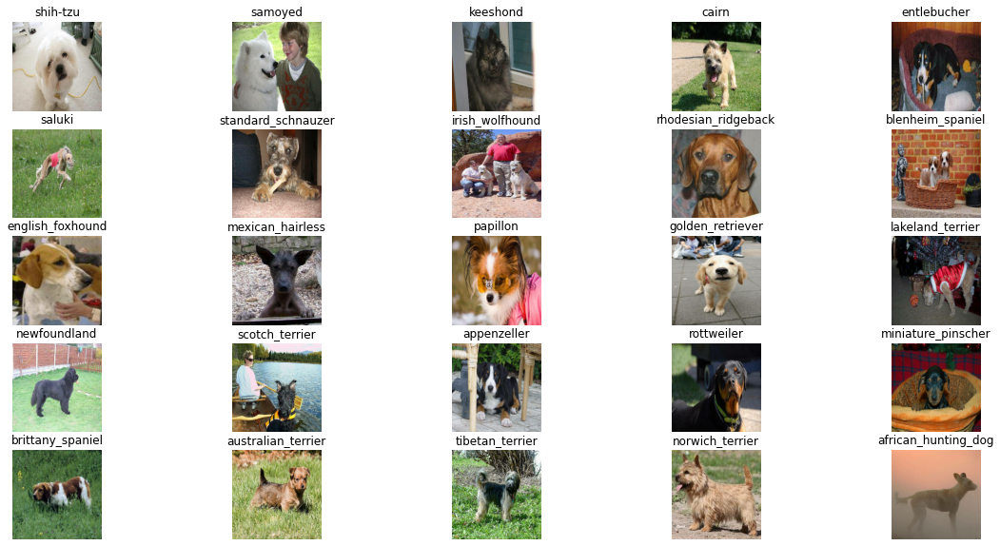

In [ ]:
# Using the function for train_data
# As we our data is shuffled in case of training, thats why we will see new images every time
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

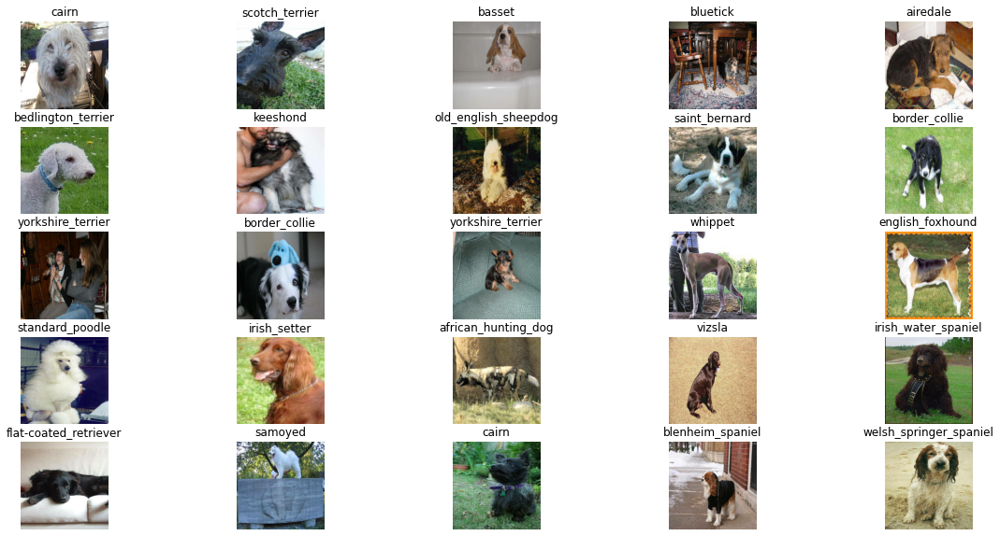

In [ ]:
# Using the funciton for validation data
# As there is no shuffling in case of validation so we will see the same image every time
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

# Building a model
Before we build a model, there are a few things we need to define:
* The input shape (our images shape, in the form of Tensors) of our model.
* The output shape (image labels, in the form of Tensors) to our model.
* The URL of our model we want to use from TensorFlow Hub: https://tfhub.dev/google/tf2-preview/mobilenet_v2/classification/4

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = 'https://tfhub.dev/google/tf2-preview/mobilenet_v2/classification/4'

Now we've inputs, outputs and model ready to go. Let's put them all together into a Keras deep learning model!
Knowing this, let's create a function which:
* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in Keras model in a sequential fashion (do first this, then this, then that).
* Compiles the model (says it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model

All of these steps are found here: https://www.tensorflow.org/guide/keras/sequential_model

In [ ]:
# Creates a function which builds a Keras Model
def create_model(input_shape = INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model_url = MODEL_URL):
  print('Creating model using', MODEL_URL)
  # Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL),
      tf.keras.layers.Dense(units = OUTPUT_SHAPE,
      activation = 'softmax')
      ])
  
  # Compile the model
  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics = ['accuracy']
      )
  
  # Build the model
  model.build(INPUT_SHAPE)
  return model

In [ ]:
model = create_model()
model.summary()

Creating model using https://tfhub.dev/google/tf2-preview/mobilenet_v2/classification/4


Instructions for updating:
Lambda fuctions will be no more assumed to be used in the statement where they are used, or at least in the same block. https://github.com/tensorflow/tensorflow/issues/56089


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              3540265   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 3,660,505
Trainable params: 120,240
Non-trainable params: 3,540,265
_________________________________________________________________


## Creating callbacks
Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops imporving and some more.

Why callbacks:
* There are some models that takes weeks for training and this case checking the progress of the model is important.
* Prevent the model from overfitting.
* Stops the model progress if it is not improving

We'll create two callbacks, one for TensorBoard which helps track our model's progress and another for early stopping which prevents our model from training for too long.

## TensorBoard Callback
To setup a TensorBoard Callback, we need to do 3 things:
1. Load the TensorBoard notebook extension
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize our model's training logs with the `%tensorboard` magic function (we'll do this after model training).

In [ ]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # create a log directory for storing TensorBoard logs
  logdir = os.path.join('drive/MyDrive/Dog Vision/logs',datetime.datetime.now().strftime('%Y%M%D-%H%M%S'))
  return tf.keras.callbacks.TensorBoard(logdir)

## Early Stopping Callback
Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.
https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [ ]:
# Create Early Stopping Callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor = 'val_accuracy',
                                                  patience = 3)

## Training a model (on subset of data)
Our first model is going to train on only 1000 images, to make sure everything is working.

In [ ]:
NUM_EPOCHS = 100  # @param {type:"slider", min:10, max:100, step:10}

In [ ]:
# Check to make sure our GPU is still running
print('GPU is running' if tf.config.list_physical_devices('GPU') else 'Not running')

GPU is running


### Let's create a function which will train the model:
* Creates a model using `create_model` function
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the fit function on our model passing it the training data, validation data, number of epochs to train for and the callbacks we'd like to use
* Return the model


In [ ]:
# Build a function to train and return the trained model
def train_model():
  """
  Trains a given model and return the trained model
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x = train_data,
            epochs = NUM_EPOCHS,
            validation_data = val_data,
            validation_freq = 1,
            callbacks = [tensorboard, early_stopping])
  
  # Return the fitted model
  return model

In [ ]:
# Fit the model to the data
train_model()

Creating model using https://tfhub.dev/google/tf2-preview/mobilenet_v2/classification/4
Epoch 1/100
25/25 [==============================] - 16s 199ms/step - loss: 4.5477 - accuracy: 0.0925 - val_loss: 3.4268 - val_accuracy: 0.2750
Epoch 2/100
25/25 [==============================] - 4s 168ms/step - loss: 1.5180 - accuracy: 0.7075 - val_loss: 2.1325 - val_accuracy: 0.4950
Epoch 3/100
25/25 [==============================] - 3s 114ms/step - loss: 0.5065 - accuracy: 0.9513 - val_loss: 1.6860 - val_accuracy: 0.5700
Epoch 4/100
25/25 [==============================] - 3s 113ms/step - loss: 0.2219 - accuracy: 0.9887 - val_loss: 1.5139 - val_accuracy: 0.5950
Epoch 5/100
25/25 [==============================] - 4s 154ms/step - loss: 0.1308 - accuracy: 0.9962 - val_loss: 1.4458 - val_accuracy: 0.6200
Epoch 6/100
25/25 [==============================] - 3s 112ms/step - loss: 0.0910 - accuracy: 0.9987 - val_loss: 1.4017 - val_accuracy: 0.6250
Epoch 7/100
25/25 [==============================] - 

**Overfitting**

**Note**: Overfitting to begin with is a good thing! it means our model is learning!!!

# Checking the TensorBoard logs
The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.


In [ ]:
%tensorboard --logdir drive/MyDrive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

# Making and Evaluating predictions using a trained model

In [ ]:
val_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
predictions = model.predict(val_data, verbose = 1)

7/7 [==============================] - 2s 142ms/step


In [ ]:
predictions

array([[3.5950291e-04, 2.0701196e-03, 2.1447828e-03, ..., 4.4540621e-04,
        1.3094743e-03, 1.1814635e-02],
       [8.3671529e-03, 7.7605355e-03, 5.0242164e-04, ..., 5.4526743e-03,
        1.4476618e-02, 6.3933978e-05],
       [2.5820622e-02, 8.8049239e-04, 2.1219293e-03, ..., 7.1737665e-04,
        5.1228241e-03, 1.4870614e-03],
       ...,
       [2.1116992e-03, 8.7884988e-04, 5.5624382e-03, ..., 1.2077672e-02,
        6.4484052e-02, 6.3559640e-04],
       [1.0142378e-02, 5.1699192e-03, 2.7894157e-03, ..., 6.4179412e-04,
        7.0120278e-03, 4.6089320e-03],
       [1.0937502e-04, 8.2812905e-03, 4.9027745e-03, ..., 3.0308012e-03,
        2.6474516e-03, 2.4760174e-04]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
# How the shape relates
len(y_val), len(unique_breeds)

(200, 120)

In [ ]:
predictions[0]

array([3.5950291e-04, 2.0701196e-03, 2.1447828e-03, 2.6352087e-03,
       5.9085147e-04, 2.1086641e-02, 7.5763389e-03, 6.4242547e-03,
       1.2041367e-02, 5.1804129e-03, 4.3865073e-02, 1.7414244e-03,
       1.3835859e-03, 3.3001846e-04, 5.6734477e-04, 4.0523731e-03,
       2.5270826e-03, 2.3370702e-03, 3.7738229e-03, 8.4047759e-04,
       9.5951455e-03, 4.1454746e-03, 2.7172703e-01, 3.6856183e-03,
       7.1679857e-03, 6.1224203e-04, 2.8157411e-03, 2.8169029e-03,
       2.3763913e-03, 1.4430879e-03, 3.1224037e-02, 5.3570252e-03,
       2.4647366e-03, 1.5351581e-03, 1.8753717e-02, 2.8420463e-03,
       9.3868288e-04, 2.1253112e-03, 2.4750903e-03, 1.9845449e-04,
       9.2329795e-04, 1.2074815e-03, 4.7543086e-03, 4.0119563e-04,
       1.2048285e-03, 4.3880413e-03, 6.4432522e-04, 1.6499052e-03,
       4.0438971e-03, 7.5633457e-04, 3.1892897e-04, 1.7750758e-03,
       4.4823607e-04, 1.5687010e-03, 2.2880040e-02, 1.1465129e-03,
       1.2962456e-03, 4.7524199e-03, 5.7084314e-03, 1.1059571e

In [ ]:
np.sum(predictions[0])

1.0

In [ ]:
np.argmax(predictions[0])

22

In [ ]:
unique_breeds[9]

'beagle'

In [ ]:
index =42
print(predictions[index]) # Prediction
print(np.max(predictions[index])) # Prediction's Probability
print(np.sum(predictions[index])) # Sum
print(np.argmax(predictions[index]))  # Max Index
print(unique_breeds[np.argmax(predictions[index])]) # Prediction Label  # unique_breeds[0.109805085]

[0.00698903 0.00046947 0.00608335 0.0003766  0.00557983 0.00140287
 0.00490762 0.00067048 0.00475672 0.02561915 0.0005938  0.02584582
 0.00438162 0.0118601  0.01322944 0.00536136 0.0006984  0.01573361
 0.00526114 0.00747094 0.0011471  0.00393276 0.00192713 0.00865644
 0.00450915 0.01803417 0.00929026 0.02739808 0.00911485 0.00749811
 0.03185451 0.01863213 0.00424796 0.00104776 0.01044619 0.00323894
 0.00468562 0.00746149 0.00200014 0.00256646 0.00517378 0.00579943
 0.0073608  0.00351639 0.00143346 0.00733096 0.00203565 0.00795463
 0.00108472 0.00168717 0.00539198 0.00871401 0.00636094 0.00252188
 0.00039537 0.00694664 0.00090511 0.05767255 0.00381147 0.00145013
 0.00077442 0.00449506 0.00138746 0.00749776 0.00822016 0.00057635
 0.01083579 0.00268255 0.00181368 0.0744989  0.00025531 0.00265711
 0.00032379 0.00538929 0.00146237 0.0727562  0.01181028 0.00126805
 0.01479863 0.00505868 0.00254428 0.00216353 0.00189343 0.00510811
 0.00136416 0.02100797 0.00476258 0.00967856 0.00311788 0.0061

In [ ]:
predictions[0]

array([3.5950291e-04, 2.0701196e-03, 2.1447828e-03, 2.6352087e-03,
       5.9085147e-04, 2.1086641e-02, 7.5763389e-03, 6.4242547e-03,
       1.2041367e-02, 5.1804129e-03, 4.3865073e-02, 1.7414244e-03,
       1.3835859e-03, 3.3001846e-04, 5.6734477e-04, 4.0523731e-03,
       2.5270826e-03, 2.3370702e-03, 3.7738229e-03, 8.4047759e-04,
       9.5951455e-03, 4.1454746e-03, 2.7172703e-01, 3.6856183e-03,
       7.1679857e-03, 6.1224203e-04, 2.8157411e-03, 2.8169029e-03,
       2.3763913e-03, 1.4430879e-03, 3.1224037e-02, 5.3570252e-03,
       2.4647366e-03, 1.5351581e-03, 1.8753717e-02, 2.8420463e-03,
       9.3868288e-04, 2.1253112e-03, 2.4750903e-03, 1.9845449e-04,
       9.2329795e-04, 1.2074815e-03, 4.7543086e-03, 4.0119563e-04,
       1.2048285e-03, 4.3880413e-03, 6.4432522e-04, 1.6499052e-03,
       4.0438971e-03, 7.5633457e-04, 3.1892897e-04, 1.7750758e-03,
       4.4823607e-04, 1.5687010e-03, 2.2880040e-02, 1.1465129e-03,
       1.2962456e-03, 4.7524199e-03, 5.7084314e-03, 1.1059571e

In [ ]:
predictions[0][0]

0.0003595029

In [ ]:
predictions[0][103]

0.003581866

In [ ]:
unique_breeds[103]

'soft-coated_wheaten_terrier'

Having the above functionality is great but we want to be able to do at scale.

And it would be even better if we can see the image, on which the prediction is been made.

In [ ]:
# Turn prediction probablities into their respective label (easier to understand)
def get_pred_labels(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

In [ ]:
get_pred_labels(predictions[0])

'brabancon_griffon'

In [ ]:
get_pred_labels(predictions[42])

'leonberg'

## Unbatching Data
Now since our validation data is still in a batch dataset, we'll have to unbatchify it to make predictions on validation images and then compare those predictions to the validation labels (true labels).

First we'll do it without function then we'll convert it into the function.

In [ ]:
# Without function
images_ = []
labels_ = []
# Unbatching the data and Loop through unbatched data
for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0], labels_[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
# Checking Whether a prediction is true or not
get_pred_labels(labels_[0]), get_pred_labels(predictions[0])

('cairn', 'brabancon_griffon')

From the above two it is clear that the prediction is False.

In [ ]:
# Creating a function to do the above
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
    
  return images, labels

In [ ]:
# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
len(val_images)

200

Now we've got the ways to get:
* Prediction Labels
* Validation Labels (True Labels)
* Validation Images

Let's make a function to make all these more visualize.

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels, an array of images and an integer(index of image i think).
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, it's predicted probability, the truth label and the target image on a single plot.

In [ ]:
def plot_pred(prediction_probabilities, prediction_labels, images, n = 1):
  """
  View the prediction, ground truth and the image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], prediction_labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_labels(pred_prob)

  # Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of title to red if the prediction is wrong and green if the prediction is right
  if pred_label == true_label:
    color = 'green'
  else:
    color = 'red'

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title('{} {:2.0f}% {}'.format(pred_label,
                                np.max(pred_prob)*100,
                                true_label),
            color = color)

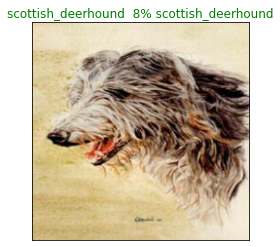

In [ ]:
plot_pred(prediction_probabilities = predictions, prediction_labels = val_labels, images = val_images, n = 130)

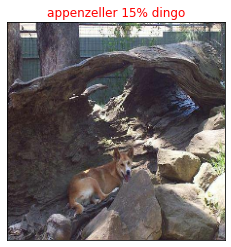

In [ ]:
plot_pred(prediction_probabilities = predictions, prediction_labels = val_labels, images = val_images, n = 29)

Now we've a function to visualize the top predictions of our model, let's make another function to view our model's top 10 predictions.

This function will:
* Take an input of prediction probabilities array, a ground truth array and an integer
* Find the prediction using `get_pred_label()`
* Find the top 10:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the truth label green


In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n = 1):
  """
  Plot the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]
  # Get the predicted label
  pred_label = get_pred_labels(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color = 'grey')

  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  
  # Change the color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color('green')
  else:
    pass

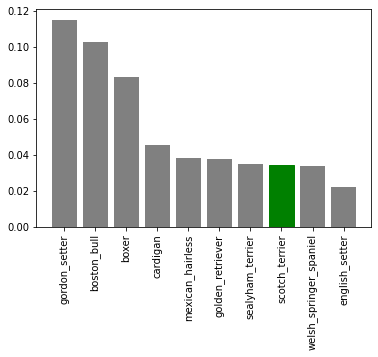

In [ ]:
plot_pred_conf(prediction_probabilities = predictions,
               labels = val_labels,
               n = 1)

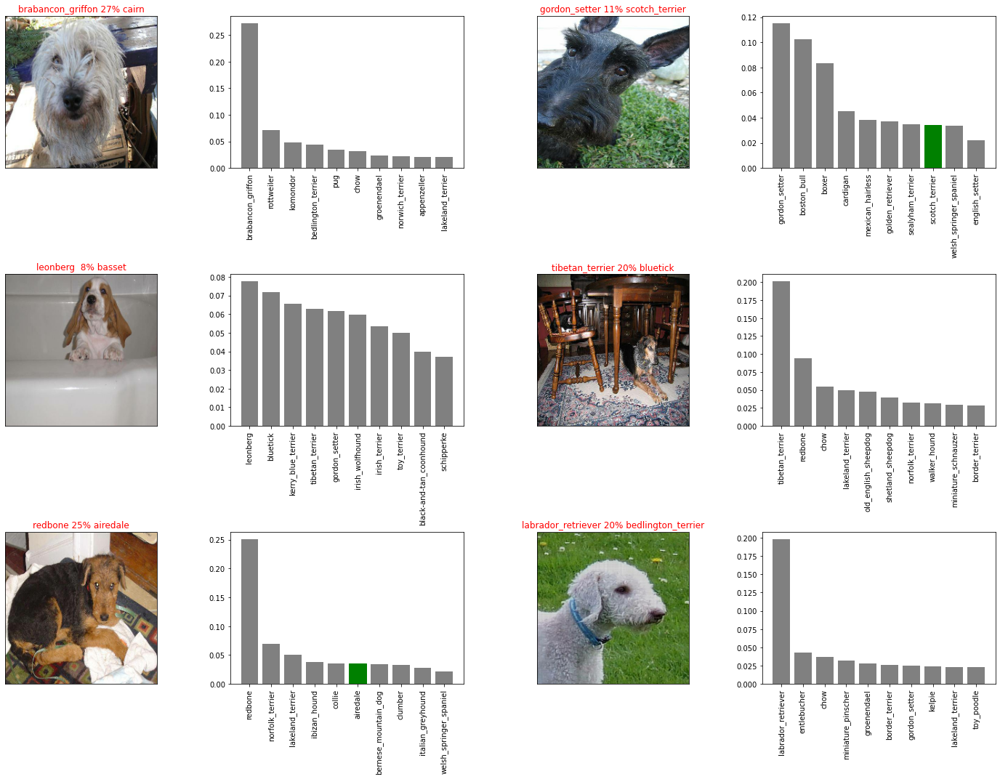

In [ ]:
# Let's check out a few predictions and their different values (default will be set to 0)
# Basically this function is combining two function's functionality plot_pred and plot_pred_conf
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize = (5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities = predictions,
            prediction_labels = val_labels,
            images = val_images,
            n = i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities = predictions, 
                 labels = val_labels,
                 n = i+i_multiplier)
plt.tight_layout(h_pad = 1.0)
plt.show()

Now we've some functions to help us visualize our predictions and evaluate our model, let's check out a few.

# Saving and Reloading the trained Model

In [ ]:
# Creatw a function to save the model
def save_model(model, suffix = None):
  """
   Saves a given model in a models directory and appends a suffix (string).
  """
  # Creating model directory pathname with current time
  model_dir = os.path.join('drive/MyDrive/Dog Vision/models',
                           datetime.datetime.now().strftime('%Y%M%D-%h%m%s'))
  model_path = model_dir +'-' + suffix + '.h5'
  print(f'Saving Model to {model_path}...')
  model.save(model_path)
  return model_path

In [ ]:
# Creating function to load the saved model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f'Loading model from {model_path}...')
  model = tf.keras.models.load_model(model_path,
                                     custom_objects = {'KerasLayer':hub.KerasLayer}
                                     )
  return model

In [ ]:
# Using the function to save the model
save_model(model, suffix = '1000-images-mobilenetv2-Adam')

Saving Model to drive/MyDrive/Dog Vision/models/20235003/23/23-Mar031679561422-1000-images-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog Vision/models/20235003/23/23-Mar031679561422-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Using the function to load the model
loaded_1000_images_model = load_model('drive/MyDrive/Dog Vision/models/20235003/23/23-Mar031679561422-1000-images-mobilenetv2-Adam.h5')

Loading model from drive/MyDrive/Dog Vision/models/20235003/23/23-Mar031679561422-1000-images-mobilenetv2-Adam.h5...


In [ ]:
# Evaluating the original `model`
model.evaluate(val_data)

7/7 [==============================] - 1s 87ms/step - loss: 5.7314 - accuracy: 0.0150


[5.73137092590332, 0.014999999664723873]

In [ ]:
# Evaluating the `loaded_1000_images_model`
loaded_1000_images_model.evaluate(val_data)

7/7 [==============================] - 1s 83ms/step - loss: 5.7314 - accuracy: 0.0150


[5.73137092590332, 0.014999999664723873]

# Training data on full dataset

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
# Create a data batch with the full dataset
full_data = create_data_batches(X, y)

Creating Train data batch...


In [ ]:
full_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model to train on full data set
full_model = create_model()

Creating model using https://tfhub.dev/google/tf2-preview/mobilenet_v2/classification/4


In [ ]:
# Create full model's callbacks
# 1.Tensorboard callback
full_model_tensorboard = create_tensorboard_callback()

# 2. Early Stopping callback
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor = 'accuracy',
                                                             patience = 3)

The below cell will take a while for running.

In [ ]:
full_model.fit(x = full_data,
               epochs = NUM_EPOCHS,
               callbacks = [full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 37s 104ms/step - loss: 1.2920 - accuracy: 0.6771
Epoch 2/100
320/320 [==============================] - 31s 97ms/step - loss: 0.3752 - accuracy: 0.8862
Epoch 3/100
320/320 [==============================] - 31s 98ms/step - loss: 0.2200 - accuracy: 0.9386
Epoch 4/100
320/320 [==============================] - 31s 98ms/step - loss: 0.1398 - accuracy: 0.9665
Epoch 5/100
320/320 [==============================] - 31s 97ms/step - loss: 0.0955 - accuracy: 0.9809
Epoch 6/100
320/320 [==============================] - 32s 99ms/step - loss: 0.0706 - accuracy: 0.9887
Epoch 7/100
320/320 [==============================] - 32s 99ms/step - loss: 0.0521 - accuracy: 0.9932
Epoch 8/100
320/320 [==============================] - 31s 98ms/step - loss: 0.0418 - accuracy: 0.9948
Epoch 9/100
320/320 [==============================] - 31s 97ms/step - loss: 0.0334 - accuracy: 0.9961
Epoch 10/100
320/320 [==============================] - 32s 100ms/step -

In [ ]:
# Saving the full model
save_model(full_model, suffix = 'full-model-mobilenetv2-Adam')

Saving Model to drive/MyDrive/Dog Vision/models/20230003/23/23-Mar031679562020-full-model-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog Vision/models/20230003/23/23-Mar031679562020-full-model-mobilenetv2-Adam.h5'

In [ ]:
# Loading the full model
loaded_full_model = load_model('drive/MyDrive/Dog Vision/models/20230003/23/23-Mar031679562020-full-model-mobilenetv2-Adam.h5')

Loading model from drive/MyDrive/Dog Vision/models/20230003/23/23-Mar031679562020-full-model-mobilenetv2-Adam.h5...


# Making predictions on the test data set
Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily, we created `creat_data_batches` earlier which can take a list of filenames as input and convert them into data batches. 

To make predictions on the test data, we'll:
* Get the test image filenames
* Convert the filenames into test data batches using `creat_data_batches` and setting the `test_data` parameter to true (since the test data doesn't have labels).
* Make a prediction array by passing the test data batches to the predict() method called on our model.

In [ ]:
# Load test image filenames
test_path = 'drive/MyDrive/Dog Vision/test/'
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog Vision/test/e379ba26a5e2e22e85975b839e0e401b.jpg',
 'drive/MyDrive/Dog Vision/test/e5fa615e36dc3b2b3f554aa5097a6ece.jpg',
 'drive/MyDrive/Dog Vision/test/e59d59ffbb65d9eae166d4068af5d9b9.jpg',
 'drive/MyDrive/Dog Vision/test/e587c21aedc81f89b83dd326e034e7e0.jpg',
 'drive/MyDrive/Dog Vision/test/dffba3aed600801a5f91c5034bec5b08.jpg',
 'drive/MyDrive/Dog Vision/test/dca9642123204fd3df080147b05e4af3.jpg',
 'drive/MyDrive/Dog Vision/test/df2a003a0b1a216effd806f03f703859.jpg',
 'drive/MyDrive/Dog Vision/test/e35b67fc659c84c31bccfbaf1dd0fe5f.jpg',
 'drive/MyDrive/Dog Vision/test/e7b4b0e7d7d76f8dbd64920f34443b25.jpg',
 'drive/MyDrive/Dog Vision/test/dddb2b191e1b1de4867f6f5e81236312.jpg']

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data = True)
test_data

Creating test data batch...


<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** Calling `predict` function on full model and passing it the test data batch will take a long time to run (about 1 hour) because the model has to check the all patterns that it learned to make a prediction.

In [ ]:
# Make predictions on test data batche using the loaded full model
test_predictions = loaded_full_model.predict(test_data, verbose = 1)

324/324 [==============================] - 209s 603ms/step


In [ ]:
# Save predictions (Numpy array) to csv file (if the runtime disconnect, we can use this file)
np.savetxt('drive/MyDrive/Dog Vision/preds_array2.csv', test_predictions, delimiter = ',')

In [ ]:
# Load prediction (Numpy array) from csv file
test_predictions = np.loadtxt('drive/MyDrive/Dog Vision/preds_array2.csv', delimiter = ',')
test_predictions[:10]

array([[1.01030740e-12, 1.14150649e-14, 4.50365526e-12, ...,
        7.48155843e-11, 9.38529165e-09, 1.81610643e-10],
       [2.45678842e-11, 1.95627316e-11, 9.95409444e-09, ...,
        2.44789646e-07, 3.56771636e-07, 4.78292986e-06],
       [1.27395897e-13, 1.20452193e-15, 1.09266574e-09, ...,
        9.79567989e-13, 3.02254818e-11, 7.76203442e-14],
       ...,
       [1.33888167e-09, 6.95637428e-12, 3.47841764e-12, ...,
        1.08438347e-09, 4.40625397e-10, 2.31507940e-07],
       [1.30708997e-07, 1.60172742e-09, 4.39785680e-07, ...,
        1.15346111e-05, 5.06518591e-05, 5.43005072e-08],
       [2.01636707e-09, 4.95620545e-10, 5.07614839e-10, ...,
        9.97043458e-07, 2.19302549e-12, 3.13040843e-11]])

In [ ]:
test_predictions[1]

array([2.45678842e-11, 1.95627316e-11, 9.95409444e-09, 1.52598489e-10,
       1.12675013e-06, 8.01530223e-06, 2.21790142e-08, 1.97855508e-04,
       2.21955224e-06, 4.59475558e-07, 1.24173027e-09, 3.66332270e-10,
       1.80055498e-10, 3.70623283e-08, 3.13179438e-09, 6.79931045e-09,
       1.83489265e-05, 1.01777937e-08, 1.29059624e-10, 1.26133661e-03,
       5.57128822e-11, 1.18604601e-06, 5.02910869e-09, 3.63536007e-11,
       1.13734998e-07, 1.63733027e-10, 5.02557285e-08, 1.60521704e-05,
       7.66796688e-08, 7.33901858e-01, 7.08714532e-10, 1.52756918e-10,
       3.95229335e-07, 9.78073622e-10, 4.93405428e-10, 4.89492265e-07,
       2.45351785e-05, 6.24763652e-06, 7.76469093e-08, 2.62982613e-09,
       2.08608242e-08, 1.13252604e-07, 4.99677233e-09, 4.01581601e-05,
       6.42935288e-11, 2.29996022e-06, 3.02334882e-07, 6.05244352e-08,
       5.93164906e-10, 3.75729270e-09, 2.35557102e-10, 5.85022875e-08,
       1.80933032e-10, 2.73021158e-07, 4.97640862e-09, 1.38520030e-03,
      

In [ ]:
unique_breeds[np.argmax(test_predictions[0])]

'toy_terrier'

In [ ]:
test_predictions.shape

(10357, 120)

## Preparing thefile with prediction probability for each dog breed of each test image.
We wants our model's prediction probability outputs in a DataFrame with an ID and a column for each different dog breed.

To get the data in this format we'll:
* Create a pandas DataFrame with an ID column as well as a column for each dog breed.
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilities) to each of the dog breed columns.
* Export the DataFrame as a csv to submit it to kaggle.

In [ ]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns = ['id'] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image id's to prediction DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]

In [ ]:
preds_df['id'] = test_ids
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e379ba26a5e2e22e85975b839e0e401b,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e5fa615e36dc3b2b3f554aa5097a6ece,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e59d59ffbb65d9eae166d4068af5d9b9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e587c21aedc81f89b83dd326e034e7e0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,dffba3aed600801a5f91c5034bec5b08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities for each breed in column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e379ba26a5e2e22e85975b839e0e401b,1.010307e-12,1.141506e-14,4.503655e-12,1.100293e-12,1.005902e-09,1.283022e-09,2.698335e-08,3.552761e-06,8.149942e-14,...,1.430120e-09,9.997876e-01,2.240103e-11,1.580013e-11,2.735975e-12,5.957277e-12,3.815949e-10,7.481558e-11,9.385292e-09,1.816106e-10
1,e5fa615e36dc3b2b3f554aa5097a6ece,2.456788e-11,1.956273e-11,9.954094e-09,1.525985e-10,1.126750e-06,8.015302e-06,2.217901e-08,1.978555e-04,2.219552e-06,...,1.537141e-06,7.294986e-05,1.033344e-06,8.782535e-08,1.065078e-06,4.960219e-07,1.335034e-07,2.447896e-07,3.567716e-07,4.782930e-06
2,e59d59ffbb65d9eae166d4068af5d9b9,1.273959e-13,1.204522e-15,1.092666e-09,1.045921e-14,1.792974e-11,2.190240e-13,5.232902e-12,9.024843e-07,6.773087e-10,...,6.673290e-12,1.140493e-07,1.569097e-11,5.430247e-14,1.395241e-14,5.458760e-15,4.612423e-11,9.795680e-13,3.022548e-11,7.762034e-14
3,e587c21aedc81f89b83dd326e034e7e0,6.421504e-09,1.581250e-10,2.964019e-10,2.659953e-09,2.628012e-08,2.351888e-11,3.965285e-09,1.781442e-10,9.764507e-09,...,2.885205e-05,3.576969e-09,5.179982e-08,6.776578e-12,4.768940e-07,4.001375e-08,1.595280e-09,2.660795e-09,6.465712e-09,9.336409e-09
4,dffba3aed600801a5f91c5034bec5b08,2.233257e-11,9.189916e-08,9.439576e-11,3.613206e-07,3.968938e-06,2.578458e-10,1.059449e-10,1.090484e-08,2.210684e-12,...,3.630180e-10,1.183581e-08,1.934463e-06,4.400729e-06,1.612932e-08,1.788592e-11,2.307350e-11,5.341832e-05,8.132494e-10,1.573865e-08


In [ ]:
# Save our prediction's dataframe to csv for the submission to kaggle
preds_df.to_csv('drive/My Drive/Dog Vision/full_model_predictions_submission_1_mobilenetV2.csv',
                index = False)

# Making predcitions on custom images
To make predictions on our custom images we'll:
* Get the filepath of our own images
* Turn the filepaths into data batches using `create_data_batches()`. And since our custom images won't have labels, we'll set the `test_data` parameter to True.
* Pass the custom image data batch to our model's `predict` method.
* Convert the prediction's output probabilities to prediction labels.
* Compare the predicted label to custom images.

In [ ]:
# Get custom image filepaths
custom_path = 'drive/MyDrive/Dog Vision/custom-test-images/'
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]
custom_image_paths

['drive/MyDrive/Dog Vision/custom-test-images/poodle.jpg',
 'drive/MyDrive/Dog Vision/custom-test-images/Airedale Terrier.jpg',
 'drive/MyDrive/Dog Vision/custom-test-images/siberian husky.jpg']

In [ ]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data = True)

Creating test data batch...


In [ ]:
custom_data

<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make prediction on the custom data
custom_predictions = loaded_full_model.predict(custom_data)

1/1 [==============================] - 2s 2s/step


In [ ]:
custom_predictions.shape

(3, 120)

In [ ]:
len(custom_predictions)

3

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_labels(custom_predictions[i]) for i in range(len(custom_predictions))]
custom_pred_labels

['standard_poodle', 'airedale', 'eskimo_dog']

In [ ]:
# Get custom images
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)
custom_images[0]

array([[[0.34075633, 0.45798323, 0.02065826],
        [0.31505606, 0.42296922, 0.03291317],
        [0.20280114, 0.29768908, 0.        ],
        ...,
        [0.07941118, 0.12647   , 0.08725432],
        [0.13690443, 0.18396327, 0.138165  ],
        [0.12282955, 0.16988838, 0.12282955]],

       [[0.3081261 , 0.42097625, 0.01120136],
        [0.2570641 , 0.36095223, 0.01489815],
        [0.23550954, 0.3282091 , 0.04028955],
        ...,
        [0.08539011, 0.13244893, 0.09323324],
        [0.1416329 , 0.18869174, 0.14289346],
        [0.120993  , 0.16805182, 0.120993  ]],

       [[0.2602413 , 0.36554876, 0.00367459],
        [0.22769797, 0.3252995 , 0.02765199],
        [0.3290704 , 0.4172147 , 0.15499792],
        ...,
        [0.09728198, 0.14227498, 0.1040922 ],
        [0.15104043, 0.19603345, 0.15300189],
        [0.12274788, 0.16774088, 0.12378079]],

       ...,

       [[0.7382899 , 0.89411974, 0.5636751 ],
        [0.76483446, 0.92066425, 0.5840572 ],
        [0.66682094, 0

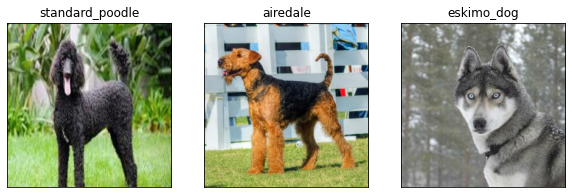

In [ ]:
# Check custom image predictions
plt.figure(figsize = (10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)